In [14]:


import os
import sys
import matplotlib.pyplot as plt
from matplotlib.widgets import PolygonSelector
import matplotlib.path as mpltPath
import matplotlib.patches as patches
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import pprint

from crystals import Crystal
from orix.quaternion import Orientation, Rotation, symmetry
from orix import plot

githubpath = '/home/lheller/Documents/GitHub'
sys.path.append(githubpath)
#[sys.path.append(os.path.join(githubpath, x)) for x in os.listdir(githubpath)]
#
from crystlibs import *
from effelconst  import *
from getphases import *
from ebsdlib  import *
import pyebsd 

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [15]:
%matplotlib widget

In [16]:
# -----------------------------------------------------------------------------
#  THE RECIPE  (edit here; everything downstream reads from it)
# -----------------------------------------------------------------------------
RECIPE = dict(
    # ---- data + crystallography (rebuilds dataEBSD; raw pixels re-read) ------
    filename = '/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang',  # source .oh5 scan
    cif_A    = '/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/cifs/NiTi - pm3m.cif',    # austenite CIF (cubic Pm-3m)
    cif_M    = '/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/cifs/NiTiB19p.cif',       # martensite CIF (B19' monoclinic)
    aA = 3.015,                          # austenite lattice parameter a [Å] (Bhattacharya 2003)
    aM = 2.889, bM = 4.12, cM = 4.622,   # martensite lattice parameters a,b,c [Å]
    betaM = 96.8 * np.pi / 180,          # martensite monoclinic angle beta [rad] (96.8°)
    phaseID = {'A': 2, 'M': 3},          # map phase name -> phase id in the .oh5 data
    or_d    = [0, 0, 1],                 # sample direction passed to select_rois(d=...)
    roiID   = 1,                         # which ROI (region of interest) to analyse
    roi_verts = None,                    # stored ROI polygon vertices (filled by
                                         # finalize_rois); None => select interactively once

    # ---- clustering (MisorientationClustering) ------------------------------
    clustering = dict(
        ang_thr=2.5,                     # grain-boundary misorientation threshold [deg]
        dmax=3,                          # max neighbour distance searched when clustering [px]
        minidxs={'A': 50, 'M': 50},                 # min cluster size [px] per phase (e.g. [austenite, martensite])
        distance=1,                      # neighbour step used for pairwise misorientation [px]
        perimeteronly={'A': False, 'M': False},     # per phase: cluster on perimeter pixels only? (A=no, M=yes)
        distance_convention="OIM"),      # neighbour/distance convention ("OIM" grid convention)

    # ---- KAM / GND (KamGND) -------------------------------------------------
    kamgnd = dict(
        distance=2,                      # neighbour shell radius for KAM/GND [px]
        perimeteronly=False,             # use all pixels (not just cluster perimeters)
        maxmis=10),                      # max misorientation counted in KAM [deg] (caps outliers)

    # ---- lamellar-cluster identification (identify_lamellar_clusters) -------
    lamellar = dict(
        phase_id=2,                      # phase to test for lamellar shape (2 = martensite)
        min_aspect_ratio=10,             # min length/width for a cluster to count as a lamella
        use_hexagonal=True,              # treat scan grid as hexagonal in the shape analysis
        use_sklearn=True,                # use scikit-learn PCA for the elongation fit
        show_progress=True,              # print a progress bar
        min_width_threshold=0,           # min lamella width [px] (0 = no lower bound)
        min_pixesl_threshold=10),        # min pixel count for a cluster to be considered

    # ---- physical reconstruction (merge fragmented grains / lamellae) -------
    reconstruct_grains   = dict(
        threshold_deg=5.0),              # merge austenite fragments if disorientation < this [deg]
    reconstruct_lamellas = dict(
        threshold_deg=5.0,               # merge martensite fragments if disorientation < this [deg]
        angle_tol_deg=8.0,               # max angle between fragment principal directions [deg]
        collinearity_tol=1.0,            # max perpendicular offset, in units of mean lamella width
        gap_tol_factor=8.0),             # max end-to-end gap along the lamella, in units of mean width

    # ---- hierarchy + meeting pairs ------------------------------------------
    hierarchy = dict(
        filter_lamellar_to_semi_rois=True,  # split each lamella into its two long-side semi-ROIs
        semi_roi_params=None,            # semi-ROI geometry overrides (None = defaults)
        min_aspect_ratio=-0.1),          # aspect-ratio floor for inclusion (-0.1 = keep all)
    meeting   = dict(
        tip_distance_threshold=15.0),    # two lamella tips are a "meeting pair" if within this [px]

    # ---- downstream analysis params (report / OR / variant compatibility) ---
    params = dict(
        frag_merge_deg=2.0,              # austenite fragment-merge threshold used in the report [deg]
        lamella_merge_deg=2.0,           # martensite fragment-merge threshold used in the report [deg]
        oop_flag_deg=20.0,               # flag habit planes whose out-of-plane angle exceeds this [deg]
        or_preserved_deg=3.0,            # OR-residual threshold for "OR preserved" across a boundary [deg]
        tip_distance_px=15.0,            # tip-proximity threshold for boundary meeting pairs [px]
        ma_threshold_deg=2.0),           # martensite disorientation to group variants within a grain [deg]
)


# Reload ROIs

In [17]:
recipe=RECIPE
c = recipe['clustering']
k = recipe['kamgnd']



dataEBSD = rebuild_dataEBSD(recipe, checkpoint_path='/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan_my_rois.h5')
print("after rebuild:", len(dataEBSD.rois.masks), len(dataEBSD.selector.selPaths))

recipe['roi_verts']  = get_roi_verts(dataEBSD)
print("after get_roi_verts:", len(dataEBSD.rois.masks), len(dataEBSD.selector.selPaths))
dataEBSD_placeholder_range = dataEBSD.rois.masks_by_phase

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.13 s
Calculating rotation matrices... 0.04 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

after rebuild: 16 16
after get_roi_verts: 16 16


# Black are clusters belo min size, white martenisite

Plotting Inverse Pole Figure... 0.08 s


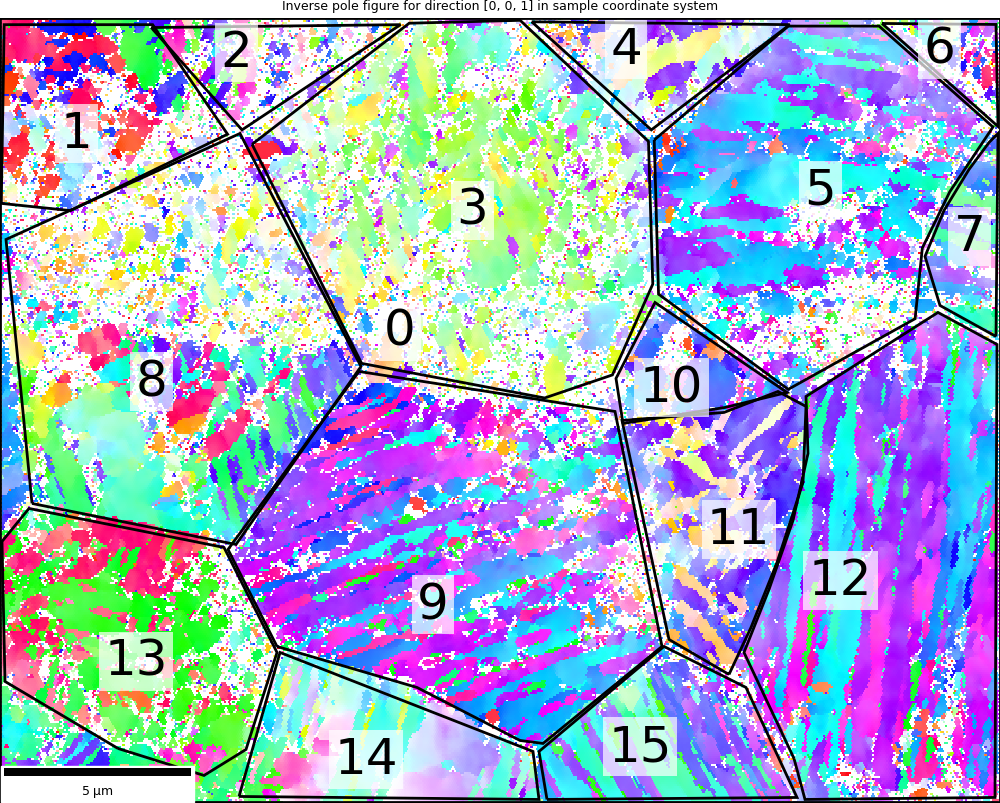

In [18]:
fig,AX = plt.subplots(1,figsize=(10,10))
fig,ax = dataEBSD.plot_IPF(ax=AX,fig=fig,d=recipe['or_d'],phase='A',colorcode=False)
for roiID in range(0,len(dataEBSD.rois.masks_by_phase)):
    patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None',edgecolor='k', lw=2)
    com=np.mean(dataEBSD.selector.selVerts[roiID],axis=0)
    ax.add_patch(patch)
    ax.text(com[0], com[1],f'{roiID}', fontsize=36, color='k', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))

In [19]:

axial_dir = np.array([0,0,1,], dtype=float)  # sample axial direction (z-axis)
axial_dir/=np.linalg.norm(axial_dir)
filepath = '/home/lheller/Documents/papers/mypapers/micromod/figs/'
SAVE = True
iforms = ['png','svg']
plt.rc('figure', figsize=(5,5))
SMALL_SIZE=9
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=SMALL_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=SMALL_SIZE)  # fontsize of the figure title
figparam={'dpi':300, 'facecolor':'None', 'edgecolor':'None',
        'orientation':'portrait', 'papertype':None, 'format':iforms[0],
        'transparent':True, 'bbox_inches':'None', 'pad_inches':0.1,
        'frameon':None}


# Analysis over all grains with data saving per grain

In [10]:
for roiID in range(1, len(dataEBSD.rois.masks_by_phase)):
    recipe['roiID'] = roiID

    # --- clustering ----------------------------------------------------------
    alg = MisorientationClustering(
        ang_thr=c['ang_thr'], dmax=c['dmax'], minidxs=c['minidxs'], roi=recipe['roiID'],
        distance=c['distance'], perimeteronly=c['perimeteronly'],
        distance_convention=c['distance_convention'])
    clustering_result = alg.fit(dataEBSD)
    clustering_result = clustering_result.symmetrize_clusters(
        cluster_ids='all', phase='A', return_clustering_result=True
    )
    dataEBSD.set_rois2d(recipe['roiID'])
    clustering_result.update_grid_2d()

    if 'hex' in dataEBSD._ebsdData.grid.lower():
        distance_convention = 'OIM'
    else:
        distance_convention = 'rect'

    misori, pair_cluster_ids = clustering_result.get_pixel_boundary_misorientations(
        phase='A', distance=1, perimeteronly=False, distance_convention=distance_convention
    )

    kg = KamGND(distance=k['distance'], perimeteronly=k['perimeteronly'],
                maxmis=k['maxmis'], roi=recipe['roiID'], cluster_id=None)
    clustering_result = kg.computeKAM(clustering_result)
    clustering_result = kg.computeGND(clustering_result)


    summary = clustering_result.print_pixel_to_average_misorientation_summary(
        cluster_ids=None, sort_by='n_pixels', printout=False
    )
    cluster1 = list(summary.keys())[0]
    results = clustering_result.evaluate_lattice_direction_homogeneity(
        anchor_cluster_id=cluster1, lattice_vec=[[1, 0, 0], [1, 1, 0], [1, 1, 1]], phase='A',
        cluster_ids='all', units='deg', print_result=False, plot_result=False
    )
    zone_axis = results[0]['lattice_vec']

    notmerged_pairs_results, notmerged_matches = clustering_result.map_twin_relationships(
        phase='A', system='NiTi', modes=['115', '114', '113', '112', '111'], tol_deg=5.0, min_size='recipe',
        sort_by='size', print_result=False
    )
    notmerged_pairs_results_kinks = clustering_result.map_kink_axes(
        phase='A', max_miller_index=2, tol_deg=5.0, min_size='recipe',
        print_result=False, print_top_n_per_pair=1, sort_by='size'
    )
    notmerged_result = clustering_result.reconstruct_parent_orientation_directed(
        phase='A', axial_dir=axial_dir, matches=notmerged_matches,
        kink_results=notmerged_pairs_results_kinks, print_result=False
    )
    notmerged_parent_results = clustering_result.check_parent_twin_relationships(
        parent_mat=notmerged_result['parent_mat'], phase='A', system='NiTi', axial_dir=axial_dir,
        modes=['115', '114', '113', '112', '111'], tol_deg=recipe['reconstruct_grains']['threshold_deg'],
        sort_by='size', print_result=False
    )
    notmerged_new_result, notmerged_groups_all, notmerged_disor_values = clustering_result.merge_clusters_to_reference(
        reference_mat=notmerged_result['parent_mat'], threshold_deg=recipe['reconstruct_grains']['threshold_deg'],
        phase='A', return_disor_values=True
    )
    report = notmerged_new_result.check_parent_reconstruction(
        parent_mat=notmerged_result['parent_mat'], merge_groups_all=notmerged_groups_all,
        phase='A', system='NiTi', axial_dir=axial_dir,
        modes=['115', '114', '113', '112', '111'], tol_deg=recipe['reconstruct_grains']['threshold_deg'],
        sort_by='size', disor_values=notmerged_disor_values,
        pre_merge_sizes=clustering_result.cluster_sizes, include_kink=True, max_miller_index=2,
        kink_tol_deg=recipe['reconstruct_grains']['threshold_deg'], print_result=False
    )

    matched_cluster_ids = [r['cluster_b'] for r in report['twin_results'] if r['is_match']] + \
                          [r['cluster_b'] for r in report.get('kink_results', []) if r['is_match']]
    if report['merged_root'] is not None:
        matched_cluster_ids.append(report['merged_root'])

    anchor_cluster_id = report['merged_root']
    if anchor_cluster_id is None:
        anchor_cluster_id = min(notmerged_disor_values, key=notmerged_disor_values.get)
        print(f"Warning: no cluster within threshold_deg of parent_mat; "
              f"falling back to closest cluster {anchor_cluster_id} "
              f"({notmerged_disor_values[anchor_cluster_id]:.2f} deg) as anchor.")

    homogenization_results = notmerged_new_result.evaluate_lattice_direction_homogeneity(
        anchor_cluster_id=anchor_cluster_id, lattice_vec=[1, 1, 0], phase='A',
        cluster_ids=matched_cluster_ids, units='deg', print_result=False
    )
    result_full = notmerged_new_result.check_martensite_twin_correspondence(
        report, lattice_vec=homogenization_results[0]['lattice_vec'], axial_dir=axial_dir,
        loading_sense='tension', tol_deg=recipe['reconstruct_grains']['threshold_deg'], print_result=False
    )

    # --- checkpoint this grain -------------------------------------------------
    checkpoint_path = os.path.join(filepath,f'grain_{str(roiID).zfill(4)}.h5')
    save_checkpoint(
        checkpoint_path,
        clustering_result=clustering_result, recipe=recipe,
        notmerged_new_result=notmerged_new_result, notmerged_result=notmerged_result,
        report=report, result_full=result_full, zone_axis=zone_axis,
        cluster1=cluster1, axial_dir=axial_dir
    )

Clustering 2 phases sequentially...
  Phase 2... 18 clusters
  Phase 3... 0 clusters
Total: 18 clusters across all phases
Calculating misorientations for 143909 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 4.88 s
Calculating misorientations for 34378 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 0.22 s
Calculating misorientations for 143909 points for 6 neighbors [1, 2, 3, 4, 5, 6] in 1.24 s
Calculating misorientations for 143909 points for 12 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] in 2.83 s
Calculating misorientations for 143909 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 4.74 s
Calculating misorientations for 143909 points for 24 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24] in 5.94 s
Calculating misorientations for 143909 points for 30 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 

# Per Grain images

In [20]:
dataEBSD = None   # reused across grains from the same scan, set on first load

for roiID in range(1, len(dataEBSD_placeholder_range)):  # adjust range to match your saved grain count
    checkpoint_path = os.path.join(filepath,f'grain_{str(roiID).zfill(4)}.h5')

    state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
    dataEBSD = state['dataEBSD']   # first iteration builds it; later iterations reuse it directly
    clustering_result = state['clustering_result']
    notmerged_new_result = state['notmerged_new_result']
    notmerged_result = state['notmerged_result']
    report = state['report']
    result_full = state['result_full']
    zone_axis = state['zone_axis']
    cluster1 = state['cluster1']
    axial_dir = state['axial_dir']
    recipe = state['recipe']




    plt.rc('figure', figsize=(5,5))
    SMALL_SIZE=9
    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=SMALL_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=SMALL_SIZE)  # fontsize of the figure title
    iforms=['png','svg']
    figname=os.path.join(filepath,f'{str(recipe["roiID"]).zfill(4)}_ebsd_clustering')
    figname02=os.path.join(filepath,f'{str(recipe["roiID"]).zfill(4)}_ebsd_reconstruction')
    figname03=os.path.join(filepath,f'{str(recipe["roiID"]).zfill(4)}_ebsd_histograms')
    figparam={'dpi':300, 'facecolor':'None', 'edgecolor':'None',
            'orientation':'portrait', 'papertype':None, 'format':iforms[0],
            'transparent':True, 'bbox_inches':'None', 'pad_inches':0.1,
            'frameon':None}


    SAVE=True
    #fig,AX = plt.subplots(1,4,figsize=(25,5))
    fig, AX = plt.subplots(1, 4, figsize=(7., 2.5), constrained_layout=True)


    ax=AX[0]
    fig,ax = dataEBSD.plot_IPF(ax=ax,fig=fig,d=recipe['or_d'],roi=recipe['roiID'],phase='A',globalScale=False,colorcode=False)
    ax.set_title(f'(a)')#\nIPF map for load. dir.')
    ax.set_title('')
    phase = 'A'
    symops = clustering_result.data.phases[phase]['symops']

    cartesian_vec = clustering_result.data.phases[phase]['L'].dot(zone_axis)
    cartesian_vec = clustering_result.data.phases[phase]['L'].dot(zone_axis)
    cartesian_vec/=np.linalg.norm(cartesian_vec)
    d = clustering_result.get_cluster_pixel_orientations(cluster_id=cluster1)['avg_mat'].T.dot(cartesian_vec)
    visualizer = EBSDVisualizer()
    rc = {'font.size': 6}
    colorkey_rect=(0.0, 0.1, 0.15, 0.15)
    with plt.rc_context(rc):
        ax_ckey = fig.add_axes(list(colorkey_rect), projection="ipf",
                                symmetry=symmetry.Oh, zorder=2)
        ax_ckey.plot_ipf_color_key(show_title=False)
        ax_ckey.patch.set_facecolor("None")
    #ax2
    ax=AX[1]
    fig, ax = visualizer.plotClusters(clustering_result,ax=ax,fig=fig,d=d, tiling=None, roi=recipe['roiID'], phase=phase,color_by='ipf',globalScale=False,colorcode=False)
    ax.set_title(f'(b)')#\nIPF map for {np.round(d, 2)} || <110>')
    ax.set_title('')
    #ax3
    sample_transform = clustering_result.get_zone_axis_transform(cluster_id=cluster1, uvw=zone_axis)
    ax=AX[2]

    fig, ax, results, cbar, vmax_used, divisor = plot_pole_figure_with_capped_colorbar(
        clustering_result, vmax_factor=0.5,   # saturate at 50% of the true max
        ax=ax, fig=fig, cluster_id='all', phase='A', uvw=zone_axis,
        pixel_plot='histogram', pixel_pooled=True,
        pixel_hist_kwargs={'cmap': get_cmap([(1, 1, 1), (1, 0, 0), (0, 1, 0), (0, 0, 1)]), 'scale': 'sqrt', 'nlevels': 100},
        equalarea=False, hemi='upper', sample_transform=sample_transform,
        linewidth=0.25, markersize=5, markeredgewidth=0.5
    )


    ax.set_title('')
    #ax4
    ax=AX[3]
    phase = 'A'
    min_size = c['minidxs'][phase]

    sizes = clustering_result.cluster_sizes
    cluster_ids = [c for c in clustering_result.labels_by_phase[phase]
                if sizes.get(c, 0) >= min_size and c in clustering_result.avg_orientations]

    M = np.array([clustering_result.avg_orientations[c] for c in cluster_ids])
    symops = list(np.array(clustering_result.data.phases[phase]['symops']))

    D = np.asarray(disorimat(M, symops), dtype=float)  # (N, N)
    iu = np.triu_indices(len(cluster_ids), k=1)
    angles = D[iu]


    #ax.hist(angles, bins=50, edgecolor='black')
    ax.hist(angles, bins=25, weights=np.full_like(angles, 1/100), edgecolor='black')

    ax.set_title('(d)\nAll-pairs misorientation')

    ax.yaxis.tick_right()
    ax.yaxis.set_label_position('right')

    ax.set_xlabel('Misorientation [deg]')#between cluster averages [deg]')
    ax.set_ylabel(r'Pixel count ($\times 10^2$)')
    ax.set_xlim(0, 65)
    ax.set_xticks(np.arange(0, 65, 10))
    ax.set_title(f'(d)')#\nAll-pairs cluster misorientation')
    ax.set_title('')
    ax.set_axisbelow(True)   # grid lines drawn BEHIND the bars, not over them
    ax.grid(axis='y', color='gray', linestyle='--', alpha=0.4)
    pos = ax.get_position()
    new_height = pos.height * 0.7   # tune this fraction to taste
    ax.set_position([pos.x0*1.08, pos.y0 + (pos.height - new_height)-0.1, pos.width, new_height])

    fig.canvas.draw()   # force constrained_layout to resolve final axes positions first

    y_label = .82       # figure-fraction y-position, shared by all four letters
    y_label3 = .7 
    y_label2 = .75 
    letters = ['(a)', '(b)', '(c)', '(d)']
    axn=0
    open_b, close_b = '[',']'
    sep=', '
    decimals = 2
    components = sep.join(f"{x:.{decimals}f}" for x in d)
    vec = f"{open_b}{components}{close_b}"
    for ax, letter in zip(AX, letters):
        axn+=1
        pos = ax.get_position()
        x_center = (pos.x0 + pos.x1) / 2
        
        if axn==1:
            fig.text(x_center, y_label, '(a)IPF ', ha='center', va='bottom', fontsize=SMALL_SIZE+2 )
            fig.text(x_center, y_label2, '[0,0,1]', ha='center', va='bottom', fontsize=SMALL_SIZE )
        elif axn==2:
            fig.text(x_center, y_label, '(b)IPF ', ha='center', va='bottom', fontsize=SMALL_SIZE+2 )
            fig.text(x_center, y_label2, vec, ha='center', va='bottom', fontsize=SMALL_SIZE )
        elif axn==3:
            fig.text(x_center, y_label, '(c)PF <110>', ha='center', va='bottom', fontsize=SMALL_SIZE+2 )
            
        else:
            fig.text(x_center, y_label, letter, ha='center', va='bottom', fontsize=SMALL_SIZE + 2)
    fig.text(0.45, 0.88, f'Grain {recipe['roiID']}', ha='center', va='bottom', fontsize=SMALL_SIZE + 2, fontweight='bold')
    if SAVE:
        for figform in iforms:
            fig.savefig(figname+'.'+figform,bbox_inches='tight',
                dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                orientation=figparam['orientation'],  format =figform,
                transparent=figparam['transparent'],  
                pad_inches= figparam['pad_inches']);


    ############################################################################
    ############################################################################






    #fig,AX = plt.subplots(1,4,figsize=(25,5))
    fig, AX = plt.subplots(1, 4, figsize=(7., 2.5), constrained_layout=True)

    ax=AX[0]

    visualizer = EBSDVisualizer()
    visualizer.plotClusters(clustering_result, ax=ax,tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)


    ax=AX[1]
    visualizer = EBSDVisualizer()
    nudge = -0.95  # tune this fraction to taste

    fig, ax = notmerged_new_result.plot_parent_reconstruction_map_clusters(
        ax=ax, fig=fig, check_result=report, phase='A', visualizer=visualizer, roi=recipe['roiID'],
        color_by_mode=True, mode_colors={'114': 'crimson', '115': 'orange', '113': 'purple'},
        legend_kwargs=dict(fontsize=7, handlelength=1.0, handletextpad=0.4,
                            labelspacing=0.3, borderpad=0.3,
                            bbox_to_anchor=(1.0, 1.0 + nudge), ncol=2),   # <-- moved up
        return_val=True
    )
    strain_result = notmerged_new_result.compute_average_strain_tensor(
        report['twin_results'], parent_mat=notmerged_result['parent_mat'], print_result=False
    )
    bbox_axes = ax.get_legend().get_window_extent().transformed(ax.transAxes.inverted())

    axial_def_twin_strain = axial_dir.dot(strain_result['tensor'].dot(axial_dir))

    notmerged_new_result.plot_deformation_ellipses(
        AX[0], [strain_result],
        labels=[f'Transverse def.\n({axial_def_twin_strain*100:.0f}% axial)'],
        undeformed_line_width=2, undeformed_color='magenta', undeformed_linestyle='-',
        colors=['k', 'magenta'],
        scale=2.0,
        legend_kwargs={'fontsize': 7, 'handlelength': 1.0, 'handletextpad': 0.4,
                        'labelspacing': 0.3, 'borderpad': 0.3,
                        'loc': 'upper left',
                        'bbox_to_anchor': (bbox_axes.x0+0.5, bbox_axes.y0 + bbox_axes.height + 0*nudge)},
    )

    ax=AX[2]
    # or colored by which martensite twin mode each cluster corresponds to
    fig, ax = notmerged_new_result.plot_martensite_correspondence_map_clusters(ax=ax, fig=fig,
        report=report, result_full=result_full, phase='A', visualizer=visualizer,
        roi=recipe['roiID'], color_by_mode=True, return_val=True,mode_colors={'114': 'crimson', '115': 'orange', '113': 'purple'},
        legend_kwargs=dict(fontsize=7, handlelength=1.0, handletextpad=0.4,
                                labelspacing=0.3, borderpad=0.3,
                                bbox_to_anchor=(1.0, 1.0 + nudge), ncol=2)
    )


    ax=AX[3]
    visualizer = EBSDVisualizer()
    matrix_and_twin_and_kink_ids = ([report['merged_root']] if report['merged_root'] is not None else []) + \
        sorted({r['cluster_b'] for r in report['twin_results'] if r['is_match']}) + \
        sorted({r['cluster_b'] for r in report.get('kink_results', []) if r['is_match']})

    fig, ax = notmerged_new_result.plot_martensite_ipf_map(ax=ax, fig=fig,
        phase='A', system='NiTi', best_variant=result_full['best_variant'], report=report, visualizer=visualizer,
        axial_dir=axial_dir, roi=recipe['roiID'], cluster_ids=matrix_and_twin_and_kink_ids,
        return_val=True,show_colorkey=False
    )
    ax.set_title('')
    rc = {'font.size': 6}
    colorkey_rect=(0.8, 0.1, 0.12, 0.12)
    with plt.rc_context(rc):
        ax_ckey = fig.add_axes(list(colorkey_rect), projection="ipf",
                                symmetry=symmetry.C2h, zorder=2)
        ax_ckey.plot_ipf_color_key(show_title=False)
        ax_ckey.patch.set_facecolor("None")

    #bbox_axes = ax.get_legend().get_window_extent().transformed(ax.transAxes.inverted())
    strain_result = notmerged_new_result.compute_average_strain_tensor(
        report['twin_results'], parent_mat=notmerged_result['parent_mat'], print_result=False
    )
    variant_strain_result = notmerged_new_result.compute_variant_strain_tensor(
        system='NiTi', best_variant=result_full['best_variant'], parent_mat=notmerged_result['parent_mat'],
        verify_against_axial_dir=axial_dir, print_result=False
    )
    
    axial_tr_strain = axial_dir.dot(variant_strain_result['tensor'].dot(axial_dir))
    axial_def_twin_strain = axial_dir.dot(strain_result['tensor'].dot(axial_dir))
    #notmerged_new_result.plot_deformation_ellipses(
    #    ax, [strain_result, variant_strain_result],
    #    labels=[f'Mean def. twins. transverse def.\n({axial_def_twin_strain*100:.0f}% axial strain)', f'Trans. transverse def. in matrix\n({axial_tr_strain*100:.0f}% axial strain)'],undeformed_line_width=3.,undeformed_color='y',
    #    colors=['green', 'magenta'],
    #    scale=2.0,
    #    legend_kwargs={'fontsize': 7, 'loc': 'upper left',
    #                    'bbox_to_anchor': (bbox_axes.x0, bbox_axes.y0 + bbox_axes.height)},
    #)
    y_label = .8       # figure-fraction y-position, shared by all four letters
    letters = ['(a)', '(b)', '(c)', '(d)']
    for ax, letter in zip(AX, letters):
        pos = ax.get_position()
        x_center = (pos.x0 + pos.x1) / 2
        fig.text(x_center, y_label, letter, ha='center', va='bottom', fontsize=SMALL_SIZE + 2)
    fig.text(0.45, 0.88, f'Grain {recipe['roiID']}', ha='center', va='bottom', fontsize=SMALL_SIZE + 2, fontweight='bold')
    if SAVE:
        for figform in iforms:
            fig.savefig(figname02+'.'+figform,bbox_inches='tight',
                dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                orientation=figparam['orientation'],  format =figform,
                transparent=figparam['transparent'],  
                pad_inches= figparam['pad_inches']);





    fig, axes = notmerged_new_result.plot_parent_reconstruction_summary(
        check_result=report, result_full=result_full, phase='A', sf_field='sf_parent',figsize=(7, 3.5), width_ratios=(1, 1.5),
        grid=True, grid_kwargs={'color': 'gray', 'linestyle': '--', 'alpha': 0.4},mode_colors=['b','b','b'],fontsize_axis=9, fontsize_bar_label=7, xtick_rotation=45, bar_label_rotation=45,
        martensite_bar_text=' ',martensite_prefix='',small_bar_vlabel_offset_fac=0.4,vertical_bar_labels={'twin_martensite':'reconstructed martensite','mode_martensite': 'reconstructed martensite'},
        pair_annotation_stagger=1
    )
    axes[0].set_title('')
    axes[1].set_title('')
    fig.text(0.45, 0.95, f'Grain {recipe['roiID']}', ha='center', va='bottom', fontsize=SMALL_SIZE + 2, fontweight='bold')
    if SAVE:
        for figform in iforms:
            fig.savefig(figname03+'.'+figform,bbox_inches='tight',
                dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                orientation=figparam['orientation'],  format =figform,
                transparent=figparam['transparent'],  
                pad_inches= figparam['pad_inches']);
    plt.close('all')


Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.14 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.05 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.05 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.03 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      -0.0342
  elongation from getTrStrain:       -0.0342
Plotting Inverse Pole Figure... 0.05 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.03 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.02 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)



Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      -0.0002
  elongation from getTrStrain:       -0.0002
Plotting Inverse Pole Figure... 0.11 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.07 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.16 s
Plotting Inverse Pole Figure... 0.11 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.11 s
Plotting Inverse Pole Figure... 0.12 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      -0.0370
  elongation from getTrStrain:       -0.0370
Plotting Inverse Pole Figure... 0.04 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.04 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.08 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.1001
  elongation from getTrStrain:       +0.1001
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.27 s
Plotting Inverse Pole Figure... 0.20 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.18 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.21 s
Plotting Inverse Pole Figure... 0.15 s
Plotting Inverse Pole Figure... 0.09 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.1033
  elongation from getTrStrain:       +0.1033
Plotting Inverse Pole Figure... 0.04 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.05 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.09 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.0909
  elongation from getTrStrain:       +0.0909
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.26 s
Plotting Inverse Pole Figure... 0.19 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.25 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.24 s
Plotting Inverse Pole Figure... 0.26 s
Plotting Inverse Pole Figure... 0.20 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.0953
  elongation from getTrStrain:       +0.0953
Plotting Inverse Pole Figure... 0.19 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.22 s
Plotting Inverse Pole Figure... 0.26 s
Plotting Inverse Pole Figure... 0.18 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.24 s
Plotting Inverse Pole Figure... 0.16 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.0196
  elongation from getTrStrain:       +0.0196
Plotting Inverse Pole Figure... 0.14 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.13 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.11 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.10 s
Plotting Inverse Pole Figure... 0.08 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.1052
  elongation from getTrStrain:       +0.1052
Plotting Inverse Pole Figure... 0.08 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.08 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.11 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.05 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.1049
  elongation from getTrStrain:       +0.1049
Plotting Inverse Pole Figure... 0.16 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.11 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.13 s
Plotting Inverse Pole Figure... 0.17 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.15 s
Plotting Inverse Pole Figure... 0.16 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.0947
  elongation from getTrStrain:       +0.0947
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.49 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.29 s
Plotting Inverse Pole Figure... 0.39 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.29 s
Plotting Inverse Pole Figure... 0.32 s
Plotting Inverse Pole Figure... 0.37 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.1056
  elongation from getTrStrain:       +0.1056
Plotting Inverse Pole Figure... 0.19 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.15 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.08 s
Plotting Inverse Pole Figure... 0.15 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.0700
  elongation from getTrStrain:       +0.0700
Plotting Inverse Pole Figure... 0.06 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.07 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.08 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.0952
  elongation from getTrStrain:       +0.0952
Plotting Inverse Pole Figure... 0.06 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.06 s


/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 

/home/lheller/Documents/GitHub/pyebsd/draw/display.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(top=1, bottom=0, right=1, left=0)


0.09 s
Plotting Inverse Pole Figure... 0.04 s

Verification along axial_dir=[0. 0. 1.]:
  elongation from this tensor:      +0.1014
  elongation from getTrStrain:       +0.1014


# Make composite images from per grain ones

In [21]:
append_images_vertically(filepath, '*_ebsd_clustering.png', 'ebsd_clustering.png')
append_images_vertically(filepath, '*_ebsd_reconstruction.png', 'ebsd_reconstruction.png')
append_images_vertically(filepath, '*_ebsd_histograms.png', 'ebsd_histograms.png')

append_svgs_vertically(filepath, '*_ebsd_clustering.svg', 'ebsd_clustering.svg')
append_svgs_vertically(filepath, '*_ebsd_reconstruction.svg', 'ebsd_reconstruction.svg')
append_svgs_vertically(filepath, '*_ebsd_histograms.svg', 'ebsd_histograms.svg')

saved -> /home/lheller/Documents/papers/mypapers/micromod/figs/ebsd_clustering.png (15 images stacked)
saved -> /home/lheller/Documents/papers/mypapers/micromod/figs/ebsd_reconstruction.png (15 images stacked)
saved -> /home/lheller/Documents/papers/mypapers/micromod/figs/ebsd_histograms.png (15 images stacked)
saved -> /home/lheller/Documents/papers/mypapers/micromod/figs/ebsd_clustering.svg (15 SVGs stacked)
saved -> /home/lheller/Documents/papers/mypapers/micromod/figs/ebsd_reconstruction.svg (15 SVGs stacked)
saved -> /home/lheller/Documents/papers/mypapers/micromod/figs/ebsd_histograms.svg (15 SVGs stacked)


# IPF All grains

Plotting Inverse Pole Figure... 0.33 s


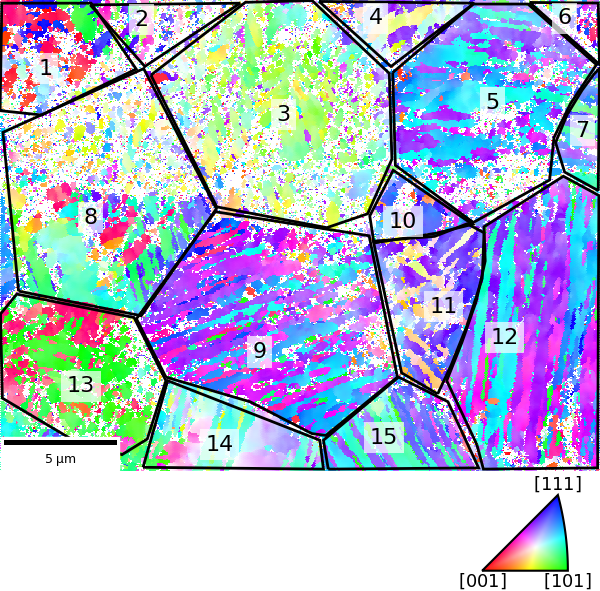

In [22]:

figname=os.path.join(filepath,f'IPF_001_allgrains')

fig,AX = plt.subplots(1,figsize=(6,6))
fig,ax = dataEBSD.plot_IPF(ax=AX,fig=fig,d=axial_dir,phase='A',colorcode=False)
for roiID in range(1,len(dataEBSD.rois.masks_by_phase)):
    patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None',edgecolor='k', lw=2)
    com=np.mean(dataEBSD.selector.selVerts[roiID],axis=0)
    ax.add_patch(patch)
    ax.text(com[0], com[1],f'{roiID}', fontsize=16, color='k', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
ax.set_title('')
rc = {'font.size': 9}
colorkey_rect=(0.8, -0.07, 0.15, 0.15)
with plt.rc_context(rc):
    ax_ckey = fig.add_axes(list(colorkey_rect), projection="ipf",
                            symmetry=symmetry.Oh, zorder=2)
    ax_ckey.plot_ipf_color_key(show_title=False)
    ax_ckey.patch.set_facecolor("w")

if SAVE:
        for figform in iforms:
            fig.savefig(figname+'.'+figform,bbox_inches='tight',
                dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                orientation=figparam['orientation'],  format =figform,
                transparent=figparam['transparent'],  
                pad_inches= figparam['pad_inches']);

# Plot Avg IPF of all clusters

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.40 s
Calculating rotation matrices... 0.08 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.11 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.17 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.05 s


/tmp/ipykernel_793807/2134795432.py:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.12 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.13 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.14 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.18 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.05 s


/tmp/ipykernel_793807/2134795432.py:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


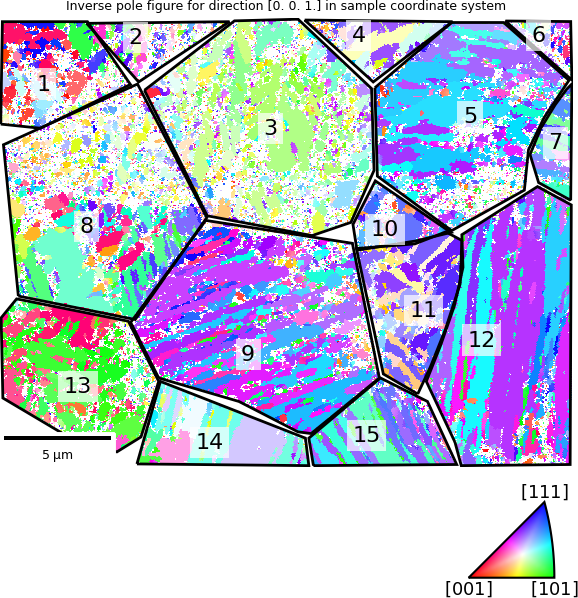

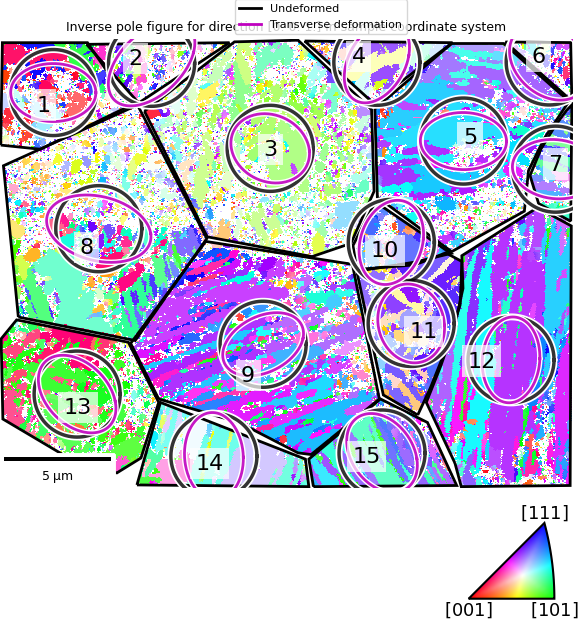

In [23]:
for PLOT_ELLIPSES in [False, True]:
    figname = os.path.join(filepath, 'clusters_avgipf_allgrains')
    fig, ax = plt.subplots(1, figsize=(6, 6))
    dataEBSD = None
    ellipse_handles_added = False
    undeformed_color = 'black'
    deformed_color = 'm'
    colorkey_rect = (0.8, -0.07, 0.15, 0.15)   # (left, bottom, width, height), figure-fraction

    if PLOT_ELLIPSES:
        figname = os.path.join(filepath, 'clusters_avgipf_allgrains_with_ellipse')

    for roiID in range(1, len(dataEBSD_placeholder_range)):
        checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')

        try:
            state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
        except FileNotFoundError:
            continue

        dataEBSD = state['dataEBSD']
        clustering_result = state['clustering_result']
        notmerged_new_result = state['notmerged_new_result']
        notmerged_result = state['notmerged_result']
        report = state['report']
        axial_dir = state['axial_dir']
        recipe = state['recipe']

        visualizer = EBSDVisualizer()
        visualizer.plotClusters(clustering_result, ax=ax, fig=fig, d=axial_dir, tiling=None,colorcode=False,
                                 roi=recipe['roiID'], phase='A', color_by='avgipf', globalScale=True)

        if PLOT_ELLIPSES:
            strain_result = notmerged_new_result.compute_average_strain_tensor(
                report['twin_results'], parent_mat=notmerged_result['parent_mat'], print_result=False
            )
            axial_def_twin_strain = axial_dir.dot(strain_result['tensor'].dot(axial_dir))

            roi_mask = dataEBSD.rois.masks[recipe['roiID']]
            grain_center = (float(dataEBSD.X[roi_mask].mean()), float(dataEBSD.Y[roi_mask].mean()))

            notmerged_new_result.plot_deformation_ellipses(
                ax, [strain_result],
                labels=[f'Transverse def.\n({axial_def_twin_strain*100:.0f}% axial)'],
                undeformed_line_width=2.5, undeformed_color=undeformed_color, undeformed_linestyle='-',
                colors=[deformed_color],
                line_width=2,
                halo=True, halo_color='white', halo_width_factor=2,
                scale=2.0,
                center=grain_center,
                show_legend=False,
            )
            ellipse_handles_added = True

    # ---- single, shared IPF color key (once, after the loop) ----
    rc = {'font.size': 9}
    with plt.rc_context(rc):
        ax_ckey = fig.add_axes(list(colorkey_rect), projection="ipf",
                                symmetry=symmetry.Oh, zorder=2)
        ax_ckey.plot_ipf_color_key(show_title=False)
        ax_ckey.patch.set_facecolor("w")

    if ellipse_handles_added:
        import matplotlib.lines as mlines
        handles = [
            mlines.Line2D([], [], color=undeformed_color, lw=2, ls='-', label='Undeformed'),
            mlines.Line2D([], [], color=deformed_color, lw=2, label='Transverse deformation'),
        ]
        ax.legend(handles=handles, loc='upper left', bbox_to_anchor=(0.4, 1.1), fontsize=8)

    for roiID in range(1, len(dataEBSD.rois.masks_by_phase)):
        patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None', edgecolor='k', lw=2)
        com = np.mean(dataEBSD.selector.selVerts[roiID], axis=0)
        ax.add_patch(patch)
        ax.text(com[0], com[1], f'{roiID}', fontsize=16, color='k', ha='center', va='center',
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.7), zorder=1e5)

    fig.tight_layout()
    if SAVE:
        for figform in iforms:
            fig.savefig(figname + '.' + figform, bbox_inches='tight',
                        dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                        orientation=figparam['orientation'], format=figform,
                        transparent=figparam['transparent'], pad_inches=figparam['pad_inches'])

# Common cluster axes all grains

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.16 s
Calculating rotation matrices... 0.03 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.17 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.09 s


/tmp/ipykernel_793807/3329419050.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.14 s
Calculating rotation matrices... 0.03 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.11 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.18 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.06 s


/tmp/ipykernel_793807/3329419050.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


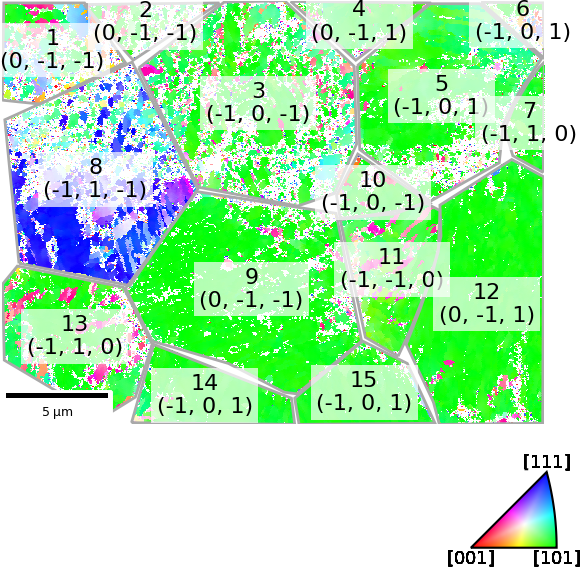

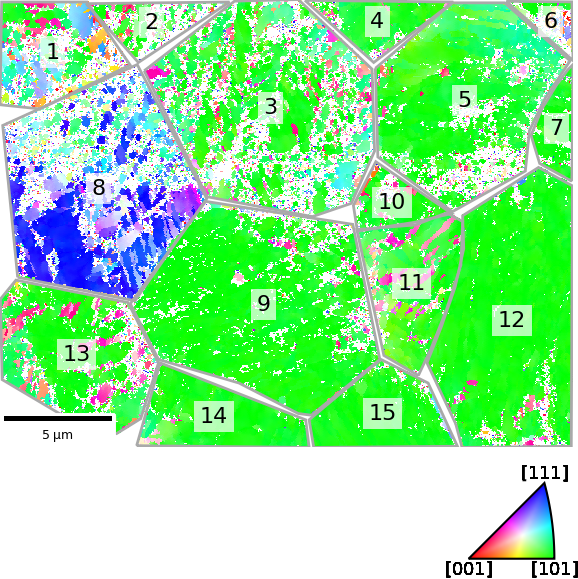

In [24]:
for SHOW_ZONE_AXIS_LABEL in [True, False]:
    fig, ax = plt.subplots(1, figsize=(6, 6))
    dataEBSD = None
    axis_label_fontsize = 9
    colorkey_rect = (0.8, -0.07, 0.15, 0.15)   # (left, bottom, width, height), figure-fraction
    for roiID in range(1, len(dataEBSD_placeholder_range)):
        checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')

        try:
            state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
        except FileNotFoundError:
            continue

        dataEBSD = state['dataEBSD']
        clustering_result = state['clustering_result']
        zone_axis = state['zone_axis']
        cluster1 = state['cluster1']
        recipe = state['recipe']

        phase = 'A'

        cartesian_vec = clustering_result.data.phases[phase]['L'].dot(zone_axis)
        cartesian_vec /= np.linalg.norm(cartesian_vec)
        d = clustering_result.get_cluster_pixel_orientations(cluster_id=cluster1)['avg_mat'].T.dot(cartesian_vec)

        visualizer = EBSDVisualizer()
        fig, ax = visualizer.plotClusters(clustering_result, ax=ax, fig=fig, d=d, tiling=None,
                                           roi=recipe['roiID'], phase=phase, color_by='ipf',
                                           globalScale=False, colorcode=False)
        ax.set_title('')

        roi_mask = dataEBSD.rois.masks[recipe['roiID']]
        grain_center = (float(dataEBSD.X[roi_mask].mean()), float(dataEBSD.Y[roi_mask].mean()))

        if SHOW_ZONE_AXIS_LABEL:
            axis_str = f"({zone_axis[0]:.0f}, {zone_axis[1]:.0f}, {zone_axis[2]:.0f})"
            label_text = f'{roiID}\n{axis_str}'
        else:
            label_text = f'{roiID}'

        ax.text(grain_center[0], grain_center[1], label_text,
                fontsize=16, color='k', ha='center', va='center',
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.7), zorder=1e5)
    # ---- single, shared IPF color key (once, after the loop) ----
        rc = {'font.size': 9}
        with plt.rc_context(rc):
            ax_ckey = fig.add_axes(list(colorkey_rect), projection="ipf",
                                    symmetry=symmetry.Oh, zorder=2)
            ax_ckey.plot_ipf_color_key(show_title=False)
            ax_ckey.patch.set_facecolor("w")
    for roiID in range(1, len(dataEBSD.rois.masks_by_phase)):
        patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None', edgecolor='darkgrey', lw=2)
        ax.add_patch(patch)

    tag = 'with_zone_axis' if SHOW_ZONE_AXIS_LABEL else 'no_zone_axis'
    figname = os.path.join(filepath, f'clusters_ipf_common_lattice_dir_{tag}')

    fig.tight_layout()
    if SAVE:
        for figform in iforms:
            fig.savefig(figname + '.' + figform, bbox_inches='tight',
                        dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                        orientation=figparam['orientation'], format=figform,
                        transparent=figparam['transparent'], pad_inches=figparam['pad_inches'])

# PF all grains

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.11 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

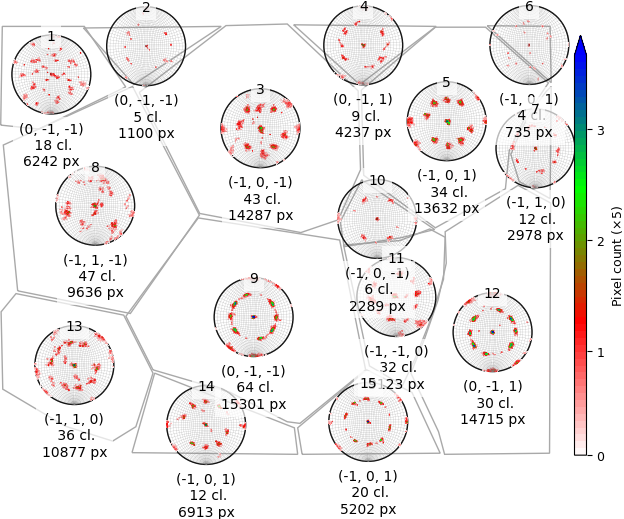

In [25]:
fig, ax, inset_axes_by_roi, last_cs = plot_pole_figure_table(
    filepath, range(1, len(dataEBSD_placeholder_range)),title_template='{axis}\n {n_clusters} cl.\n{n_px} px',
    show_colorbar=False, return_val=True, figsize=(6,6),title_fontsize=10, id_fontsize=10,
)

cbar, vmax_actual, divisor = format_pole_figure_pixel_colorbar(
    fig, ax, last_cs, label_base='Pixel count',
    cax_rect=[0.98, 0.15, 0.02, 0.7]   # place wherever you want, figure-fraction
)

fig.tight_layout()

if SAVE:
    for figform in iforms:
        fig.savefig(os.path.join(filepath, 'pole_figures_table') + '.' + figform,
                     bbox_inches='tight', dpi=figparam['dpi'], transparent=figparam['transparent'])

# Histograms all grains

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.12 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

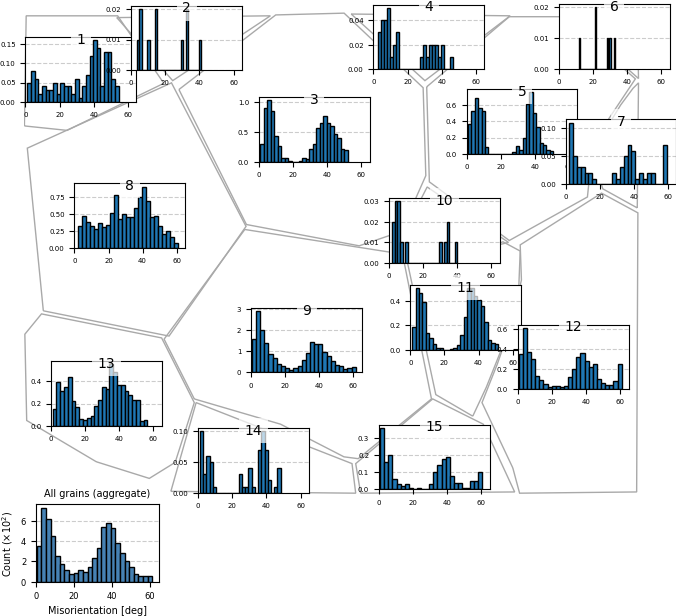

In [26]:
figname = os.path.join(filepath, 'misorientation_histograms_allgrains')

SHARED_AXIS_LABELS = True   # True: one aggregate histogram (with labels) in a corner; False: per-inset labels

fig, ax = plt.subplots(1, figsize=(7,7))
for spine in ax.spines.values():
    spine.set_visible(False)

dataEBSD = None
grain_centers = {}
per_grain_state = {}
all_angles = []   # accumulated across every grain, for the aggregate corner histogram

# ---- pass 0: load every grain, collect centers ----
for roiID in range(1, len(dataEBSD_placeholder_range)):
    checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')
    try:
        state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
    except FileNotFoundError:
        continue
    dataEBSD = state['dataEBSD']
    recipe = state['recipe']
    roi_mask = dataEBSD.rois.masks[recipe['roiID']]
    grain_centers[roiID] = (float(dataEBSD.X[roi_mask].mean()), float(dataEBSD.Y[roi_mask].mean()))
    per_grain_state[roiID] = state

if not grain_centers:
    raise ValueError("No grain checkpoints found.")

ax.set_xlim(float(dataEBSD.X.min()), float(dataEBSD.X.max()))
ax.set_ylim(float(dataEBSD.Y.min()), float(dataEBSD.Y.max()))
ax.set_aspect('equal')
ax.invert_yaxis()
ax.set_xticks([])
ax.set_yticks([])

# ---- auto-size each inset, same heuristic as the pole-figure table ----
centers = np.array(list(grain_centers.values()))
if len(centers) > 1:
    dists = []
    for i in range(len(centers)):
        d = np.linalg.norm(centers - centers[i], axis=1)
        d[i] = np.inf
        dists.append(d.min())
    inset_half_size = 0.4 * np.median(dists)
else:
    inset_half_size = 0.2 * (ax.get_xlim()[1] - ax.get_xlim()[0])

inset_width = inset_half_size * 2.4     # wider than tall -- better fit for a histogram
inset_height = inset_half_size * 1.4

phase = 'A'

# ---- pass 1: draw each grain's ROI outline + disorientation histogram inset ----
for roiID, (cx, cy) in grain_centers.items():
    state = per_grain_state[roiID]
    clustering_result = state['clustering_result']
    recipe = state['recipe']
    dEB = state['dataEBSD']

    patch = patches.PathPatch(dEB.selector.selPaths[recipe['roiID']],
                               facecolor='None', edgecolor='darkgrey', lw=1, zorder=1)
    ax.add_patch(patch)

    min_size = recipe['clustering']['minidxs'][phase]   # adjust key path if your recipe dict differs

    sizes = clustering_result.cluster_sizes
    cluster_ids = [cid for cid in clustering_result.labels_by_phase[phase]
                   if sizes.get(cid, 0) >= min_size and cid in clustering_result.avg_orientations]

    if len(cluster_ids) < 2:
        continue

    M = np.array([clustering_result.avg_orientations[cid] for cid in cluster_ids])
    symops = list(np.array(clustering_result.data.phases[phase]['symops']))
    D = np.asarray(disorimat(M, symops), dtype=float)
    iu = np.triu_indices(len(cluster_ids), k=1)
    angles = D[iu]
    all_angles.append(angles)

    bounds = [cx - inset_width / 2, cy - inset_height / 2, inset_width, inset_height]
    inset_ax = ax.inset_axes(bounds, transform=ax.transData, zorder=5)
    inset_ax.set_facecolor('white')

    inset_ax.hist(angles, bins=25, weights=np.full_like(angles, 1 / 100), edgecolor='black')
    inset_ax.set_xlim(0, 65)
    inset_ax.set_xticks(np.arange(0, 65, 20))
    inset_ax.tick_params(labelsize=5)
    inset_ax.set_axisbelow(True)
    inset_ax.grid(axis='y', color='gray', linestyle='--', alpha=0.4)

    if not SHARED_AXIS_LABELS:
        inset_ax.set_xlabel('Misorientation [deg]', fontsize=6)
        inset_ax.set_ylabel(r'Count ($\times 10^2$)', fontsize=6)

    ax.text(cx, cy - inset_height / 2 - 0.1 * inset_half_size, str(roiID),
            fontsize=10, ha='center', va='top', zorder=6,
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))

# ---- aggregate "legend" histogram in a corner, WITH axis labels ----
if SHARED_AXIS_LABELS and all_angles:
    all_angles_combined = np.concatenate(all_angles)

    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    #aggregate position
    corner_width = 0.20 * abs(xlim[1] - xlim[0])
    corner_height = 0.16 * abs(ylim[1] - ylim[0])
    corner_x0 = xlim[0] + 0.02 * abs(xlim[1] - xlim[0])
    corner_y0 = max(ylim) + 0.02 * abs(ylim[1] - ylim[0])   # bottom-left corner, y-axis inverted-aware

    legend_ax = ax.inset_axes([corner_x0, corner_y0, corner_width, corner_height],
                               transform=ax.transData, zorder=10)
    legend_ax.set_facecolor('white')
    legend_ax.patch.set_alpha(0.95)

    legend_ax.hist(all_angles_combined, bins=25,
                    weights=np.full_like(all_angles_combined, 1 / 100), edgecolor='black', color='steelblue')
    legend_ax.set_xlim(0, 65)
    legend_ax.set_xticks(np.arange(0, 65, 20))
    legend_ax.tick_params(labelsize=6)
    legend_ax.set_axisbelow(True)
    legend_ax.grid(axis='y', color='gray', linestyle='--', alpha=0.4)
    legend_ax.set_xlabel('Misorientation [deg]', fontsize=7)
    legend_ax.set_ylabel(r'Count ($\times 10^2$)', fontsize=7)
    legend_ax.set_title('All grains (aggregate)', fontsize=7)

fig.tight_layout()
if SAVE:
    for figform in iforms:
        fig.savefig(figname + '.' + figform, bbox_inches='tight',
                    dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                    orientation=figparam['orientation'], format=figform,
                    transparent=figparam['transparent'], pad_inches=figparam['pad_inches'])

# Clustering all grains

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.11 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.20 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.04 s
Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.11 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.21 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.32 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.58 s
Plotting Inverse Pole Figure... 0.26 s
Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.11 s
Plotting Inverse Pole Figure... 0.24 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.04 s


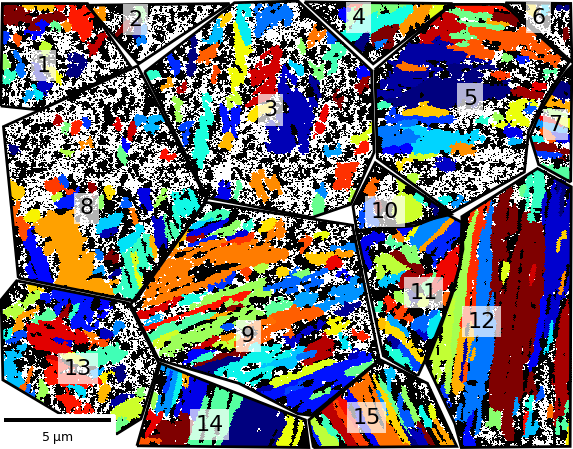

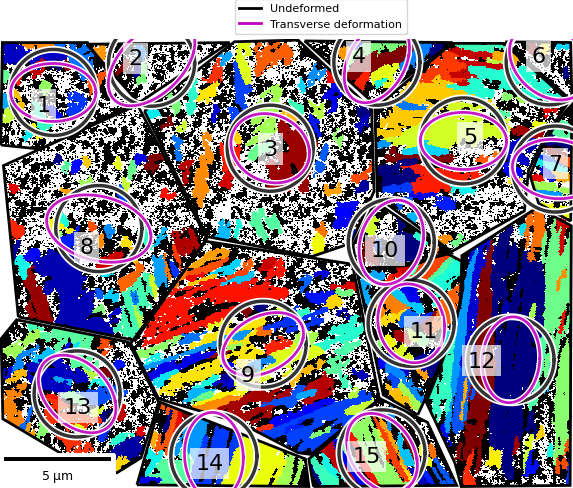

In [27]:
for PLOT_ELLIPSES in [False,True]:
    figname = os.path.join(filepath, 'clusters_allgrains')
    fig, ax = plt.subplots(1, figsize=(6, 6))
    dataEBSD = None
    ellipse_handles_added = False
    undeformed_color = 'black'
    deformed_color = 'm'
    # set False to skip strain ellipses entirely
    if PLOT_ELLIPSES:
        figname = os.path.join(filepath, 'clusters_allgrains_with_ellipse')
    for roiID in range(1, len(dataEBSD_placeholder_range)):
        checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')

        try:
            state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
        except FileNotFoundError:
            continue

        dataEBSD = state['dataEBSD']
        clustering_result = state['clustering_result']
        notmerged_new_result = state['notmerged_new_result']
        notmerged_result = state['notmerged_result']
        report = state['report']
        axial_dir = state['axial_dir']
        recipe = state['recipe']

        visualizer = EBSDVisualizer()
        visualizer.plotClusters(clustering_result, ax=ax, tiling=None, roi=recipe['roiID'],
                                phase='A', color_by='cluster', globalScale=True)

        if PLOT_ELLIPSES:
            strain_result = notmerged_new_result.compute_average_strain_tensor(
                report['twin_results'], parent_mat=notmerged_result['parent_mat'], print_result=False
            )
            axial_def_twin_strain = axial_dir.dot(strain_result['tensor'].dot(axial_dir))

            roi_mask = dataEBSD.rois.masks[recipe['roiID']]
            grain_center = (float(dataEBSD.X[roi_mask].mean()), float(dataEBSD.Y[roi_mask].mean()))

            notmerged_new_result.plot_deformation_ellipses(
                ax, [strain_result],
                labels=[f'Transverse def.\n({axial_def_twin_strain*100:.0f}% axial)'],
                undeformed_line_width=2.5, undeformed_color=undeformed_color, undeformed_linestyle='-',
                colors=[deformed_color],
                line_width=2,
                halo=True, halo_color='white', halo_width_factor=2,
                scale=2.0,
                center=grain_center,
                show_legend=False,
            )
            ellipse_handles_added = True

    if ellipse_handles_added:
        import matplotlib.lines as mlines
        handles = [
            mlines.Line2D([], [], color=undeformed_color, lw=2, ls='-', label='Undeformed'),
            mlines.Line2D([], [], color=deformed_color, lw=2, label='Transverse deformation'),
        ]
        ax.legend(handles=handles, loc='upper left', bbox_to_anchor=(0.4, 1.1), fontsize=8)

    for roiID in range(1, len(dataEBSD.rois.masks_by_phase)):
        patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None', edgecolor='k', lw=2)
        com = np.mean(dataEBSD.selector.selVerts[roiID], axis=0)
        ax.add_patch(patch)
        ax.text(com[0], com[1], f'{roiID}', fontsize=16, color='k', ha='center', va='center',
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.7), zorder=1e5)

    fig.tight_layout()
    if SAVE:
        for figform in iforms:
            fig.savefig(figname + '.' + figform, bbox_inches='tight',
                        dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                        orientation=figparam['orientation'], format=figform,
                        transparent=figparam['transparent'], pad_inches=figparam['pad_inches'])

# Austenite twins all grains

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.13 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.45 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.24 s
Plotting Inverse Pole Figure... 0.28 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.46 s
Plotting Inverse Pole Figure... 0.19 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.05 s
Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.11 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.21 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.23 s
Plotting Inverse Pole Figure... 0.38 s
Plotting Inverse Pole Figure... 0.45 s
Plotting Inverse Pole Figure... 0.34 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.17 s
Plotting Inverse Pole Figure... 0.37 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.04 s


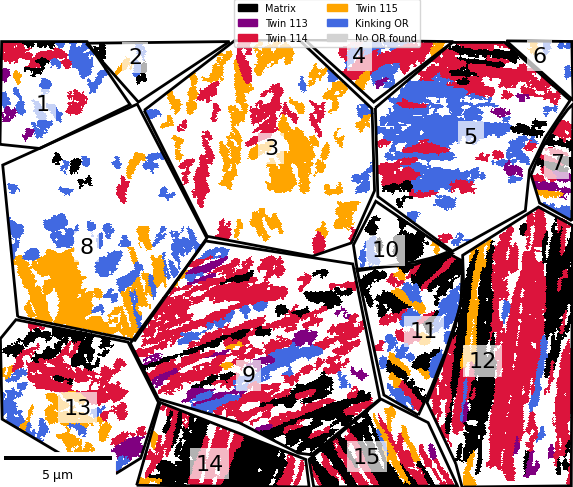

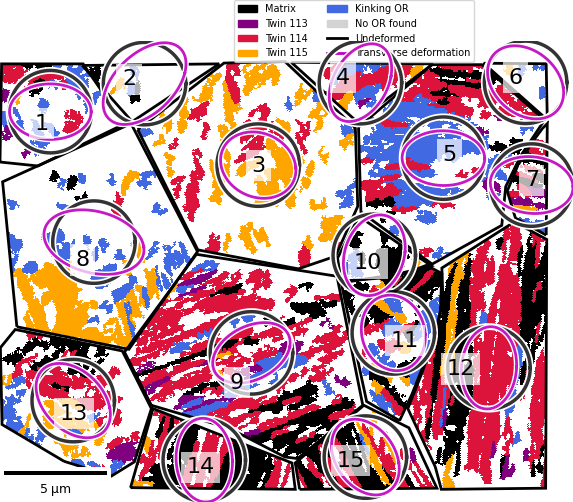

In [28]:

for PLOT_TWIN_ELLIPSES in [False,True]:
    fig, ax = plt.subplots(1, figsize=(6, 6))
    dataEBSD = None
    figname = os.path.join(filepath, 'twins_allgrains')
    mode_colors = {'114': 'crimson', '115': 'orange', '113': 'purple'}
    undeformed_color = 'black'
    deformed_color = 'm'
    #PLOT_TWIN_ELLIPSES = True   # set False to skip ellipses entirely
    handles_added = False
    if PLOT_TWIN_ELLIPSES:
        figname = os.path.join(filepath, 'twins_allgrains_ellipses')
    for roiID in range(1, len(dataEBSD_placeholder_range)):
        checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')

        try:
            state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
        except FileNotFoundError:
            continue

        dataEBSD = state['dataEBSD']
        clustering_result = state['clustering_result']
        notmerged_new_result = state['notmerged_new_result']
        notmerged_result = state['notmerged_result']
        report = state['report']
        axial_dir = state['axial_dir']
        recipe = state['recipe']

        visualizer = EBSDVisualizer()
        fig, ax = notmerged_new_result.plot_parent_reconstruction_map_clusters(
            ax=ax, fig=fig, check_result=report, phase='A', visualizer=visualizer, roi=recipe['roiID'],
            color_by_mode=True, mode_colors=mode_colors,
            legend_kwargs=dict(fontsize=0.001),
            return_val=True,
        )
        existing_legend = ax.get_legend()
        if existing_legend is not None:
            existing_legend.remove()

        if PLOT_TWIN_ELLIPSES:
            strain_result = notmerged_new_result.compute_average_strain_tensor(
                report['twin_results'], parent_mat=notmerged_result['parent_mat'], print_result=False
            )
            axial_def_twin_strain = axial_dir.dot(strain_result['tensor'].dot(axial_dir))

            roi_mask = dataEBSD.rois.masks[recipe['roiID']]
            grain_center = (float(dataEBSD.X[roi_mask].mean()), float(dataEBSD.Y[roi_mask].mean()))

            notmerged_new_result.plot_deformation_ellipses(
                ax, [strain_result],
                labels=[f'Transverse def.\n({axial_def_twin_strain*100:.0f}% axial)'],
                undeformed_line_width=2.5, undeformed_color=undeformed_color, undeformed_linestyle='-',
                colors=[deformed_color],
                line_width=2,
                halo=True, halo_color='white', halo_width_factor=2,
                scale=2.0,
                center=grain_center,
                show_legend=False,
            )
        handles_added = True

    if handles_added:
        import matplotlib.patches as mpatches
        import matplotlib.lines as mlines
        handles = [
            mpatches.Patch(color='black', label='Matrix'),
            mpatches.Patch(color=mode_colors.get('113', 'crimson'), label='Twin 113'),
            mpatches.Patch(color=mode_colors.get('114', 'orange'), label='Twin 114'),
            mpatches.Patch(color=mode_colors.get('115', 'purple'), label='Twin 115'),
            mpatches.Patch(color='royalblue', label='Kinking OR'),
            mpatches.Patch(color='lightgray', label='No OR found'),
        ]
        if PLOT_TWIN_ELLIPSES:
            handles += [
                mlines.Line2D([], [], color=undeformed_color, lw=2, ls='-', label='Undeformed'),
                mlines.Line2D([], [], color=deformed_color, lw=2, label='Transverse deformation'),
            ]
        ax.legend(handles=handles, loc='upper left', bbox_to_anchor=(0.4, 1.1), fontsize=7, ncol=2)

    for roiID in range(1, len(dataEBSD.rois.masks_by_phase)):
        patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None', edgecolor='k', lw=2)
        com = np.mean(dataEBSD.selector.selVerts[roiID], axis=0)
        ax.add_patch(patch)
        ax.text(com[0], com[1], f'{roiID}', fontsize=16, color='k', ha='center', va='center',
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.7), zorder=1e5)

    fig.tight_layout()
    if SAVE:
        for figform in iforms:
            fig.savefig(figname + '.' + figform, bbox_inches='tight',
                        dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                        orientation=figparam['orientation'], format=figform,
                        transparent=figparam['transparent'], pad_inches=figparam['pad_inches'])

# Reconstructed martensite twins all grains

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.11 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.20 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.19 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.33 s
Plotting Inverse Pole Figure... 0.26 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.15 s
Plotting Inverse Pole Figure... 0.29 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.04 s
Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.12 s
Calculating rotation matrices... 0.04 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.14 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.22 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.30 s
Plotting Inverse Pole Figure... 0.31 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.19 s
Plotting Inverse Pole Figure... 0.35 s
Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.05 s


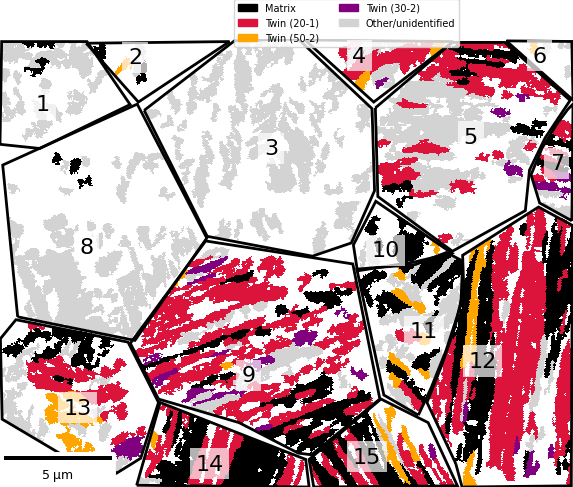

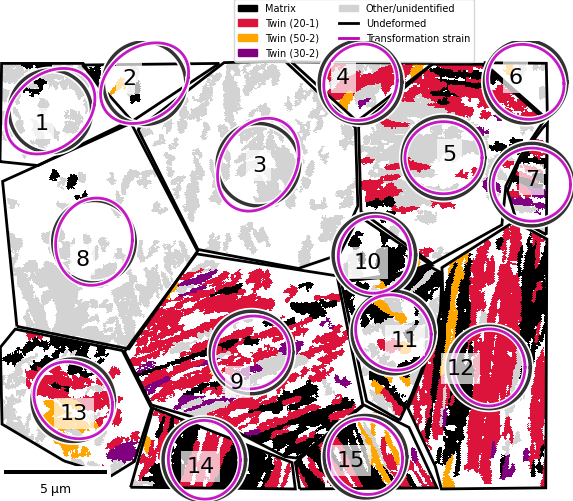

In [29]:
mode_to_martensite_plane_label = {
    '112': '10-1', '113': '30-2', '114': '20-1', '115': '50-2', '116': '30-1',
}

for PLOT_TRANSFORMATION_ELLIPSES in [False, True]:
    figname = os.path.join(filepath, 'martensite_twins_allgrains')
    fig, ax = plt.subplots(1, figsize=(6, 6))
    dataEBSD = None

    mode_colors = {'114': 'crimson', '115': 'orange', '113': 'purple'}
    undeformed_color = 'black'
    deformed_color = 'm'
    handles_added = False
    if PLOT_TRANSFORMATION_ELLIPSES:
        figname = os.path.join(filepath, 'martensite_twins_allgrains_with_ellipses')

    for roiID in range(1, len(dataEBSD_placeholder_range)):
        checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')

        try:
            state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
        except FileNotFoundError:
            continue

        dataEBSD = state['dataEBSD']
        clustering_result = state['clustering_result']
        notmerged_new_result = state['notmerged_new_result']
        notmerged_result = state['notmerged_result']
        report = state['report']
        result_full = state['result_full']
        axial_dir = state['axial_dir']
        recipe = state['recipe']

        visualizer = EBSDVisualizer()
        fig, ax = notmerged_new_result.plot_martensite_correspondence_map_clusters(
            ax=ax, fig=fig, report=report, result_full=result_full, phase='A', visualizer=visualizer,
            roi=recipe['roiID'], color_by_mode=True, mode_colors=mode_colors,
            mode_martensite_labels=mode_to_martensite_plane_label,
            legend_kwargs=dict(fontsize=0.001),
            return_val=True,
        )
        existing_legend = ax.get_legend()
        if existing_legend is not None:
            existing_legend.remove()

        if PLOT_TRANSFORMATION_ELLIPSES:
            variant_strain_result = notmerged_new_result.compute_variant_strain_tensor(
                system='NiTi', best_variant=result_full['best_variant'],
                parent_mat=notmerged_result['parent_mat'], print_result=False
            )
            axial_tr_strain = axial_dir.dot(variant_strain_result['tensor'].dot(axial_dir))

            roi_mask = dataEBSD.rois.masks[recipe['roiID']]
            grain_center = (float(dataEBSD.X[roi_mask].mean()), float(dataEBSD.Y[roi_mask].mean()))

            notmerged_new_result.plot_deformation_ellipses(
                ax, [variant_strain_result],
                labels=[f'Transformation strain\n({axial_tr_strain*100:.0f}% axial)'],
                undeformed_line_width=2.5, undeformed_color=undeformed_color, undeformed_linestyle='-',
                colors=[deformed_color],
                line_width=2,
                halo=True, halo_color='white', halo_width_factor=2,
                scale=2.0, strain_scale=2,
                center=grain_center,
                show_legend=False,
            )
        handles_added = True

    if handles_added:
        import matplotlib.patches as mpatches
        import matplotlib.lines as mlines
        handles = [mpatches.Patch(color='black', label='Matrix')]
        for mode, color in mode_colors.items():
            m_label = mode_to_martensite_plane_label.get(mode, mode)
            handles.append(mpatches.Patch(color=color, label=f'Twin ({m_label})'))
        handles.append(mpatches.Patch(color='lightgray', label='Other/unidentified'))

        if PLOT_TRANSFORMATION_ELLIPSES:
            handles += [
                mlines.Line2D([], [], color=undeformed_color, lw=2, ls='-', label='Undeformed'),
                mlines.Line2D([], [], color=deformed_color, lw=2, label='Transformation strain'),
            ]
        ax.legend(handles=handles, loc='upper left', bbox_to_anchor=(0.4, 1.1), fontsize=7, ncol=2)

    for roiID in range(1, len(dataEBSD.rois.masks_by_phase)):
        patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None', edgecolor='k', lw=2)
        com = np.mean(dataEBSD.selector.selVerts[roiID], axis=0)
        ax.add_patch(patch)
        ax.text(com[0], com[1], f'{roiID}', fontsize=16, color='k', ha='center', va='center',
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.7), zorder=1e5)

    fig.tight_layout()
    if SAVE:
        for figform in iforms:
            fig.savefig(figname + '.' + figform, bbox_inches='tight',
                        dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                        orientation=figparam['orientation'], format=figform,
                        transparent=figparam['transparent'], pad_inches=figparam['pad_inches'])

# Reconstructed martensite orientation in all grains

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.14 s
Calculating rotation matrices... 0.03 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.16 s
Plotting Inverse Pole Figure... 0.02 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.26 s
Plotting Inverse Pole Figure... 0.17 s
Plotting Inverse Pole Figure... 0.18 s
Plotting Inverse Pole Figure... 0.02 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.46 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.04 s


/tmp/ipykernel_793807/3800109637.py:90: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.14 s
Calculating rotation matrices... 0.03 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.27 s
Plotting Inverse Pole Figure... 0.02 s
Plotting Inverse Pole Figure... 0.13 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.49 s
Plotting Inverse Pole Figure... 0.48 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.22 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.04 s


/tmp/ipykernel_793807/3800109637.py:90: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


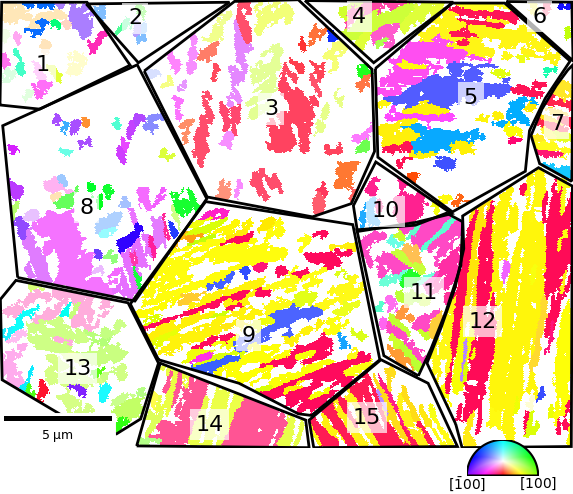

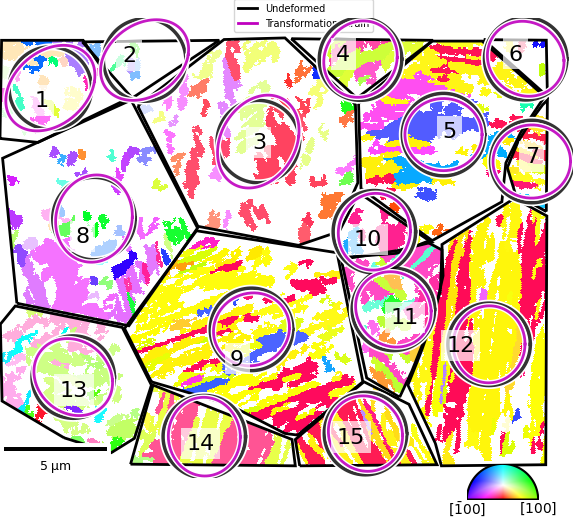

In [30]:
for PLOT_TRANSFORMATION_ELLIPSES in [False, True]:
    figname = os.path.join(filepath, 'martensite_ipf_allgrains')
    fig, ax = plt.subplots(1, figsize=(6, 6))
    dataEBSD = None

    undeformed_color = 'black'
    deformed_color = 'm'
    ellipse_handles_added = False
    colorkey_rect = (0.8, 0.05, 0.12, 0.12)   # (left, bottom, width, height), figure-fraction -- tune to taste

    if PLOT_TRANSFORMATION_ELLIPSES:
        figname = os.path.join(filepath, 'martensite_ipf_allgrains_with_ellipses')

    for roiID in range(1, len(dataEBSD_placeholder_range)):
        checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')

        try:
            state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
        except FileNotFoundError:
            continue

        dataEBSD = state['dataEBSD']
        clustering_result = state['clustering_result']
        notmerged_new_result = state['notmerged_new_result']
        notmerged_result = state['notmerged_result']
        report = state['report']
        result_full = state['result_full']
        axial_dir = state['axial_dir']
        recipe = state['recipe']

        visualizer = EBSDVisualizer()
        matrix_and_twin_and_kink_ids = ([report['merged_root']] if report['merged_root'] is not None else []) + \
            sorted({r['cluster_b'] for r in report['twin_results'] if r['is_match']}) + \
            sorted({r['cluster_b'] for r in report.get('kink_results', []) if r['is_match']})

        fig, ax = notmerged_new_result.plot_martensite_ipf_map(
            ax=ax, fig=fig, phase='A', system='NiTi', best_variant=result_full['best_variant'],
            report=report, visualizer=visualizer, axial_dir=axial_dir, roi=recipe['roiID'],
            cluster_ids=matrix_and_twin_and_kink_ids, return_val=True, show_colorkey=False
        )
        ax.set_title('')

        if PLOT_TRANSFORMATION_ELLIPSES:
            variant_strain_result = notmerged_new_result.compute_variant_strain_tensor(
                system='NiTi', best_variant=result_full['best_variant'],
                parent_mat=notmerged_result['parent_mat'], print_result=False
            )
            axial_tr_strain = axial_dir.dot(variant_strain_result['tensor'].dot(axial_dir))

            roi_mask = dataEBSD.rois.masks[recipe['roiID']]
            grain_center = (float(dataEBSD.X[roi_mask].mean()), float(dataEBSD.Y[roi_mask].mean()))

            notmerged_new_result.plot_deformation_ellipses(
                ax, [variant_strain_result],
                labels=[f'Transformation strain\n({axial_tr_strain*100:.0f}% axial)'],
                undeformed_line_width=2.5, undeformed_color=undeformed_color, undeformed_linestyle='-',
                colors=[deformed_color],
                line_width=2,
                halo=True, halo_color='white', halo_width_factor=2,
                scale=2.0, strain_scale=2,
                center=grain_center,
                show_legend=False,
            )
            ellipse_handles_added = True

    # ---- single, shared IPF color key (once, after the loop) ----
    rc = {'font.size': 6}
    with plt.rc_context(rc):
        ax_ckey = fig.add_axes(list(colorkey_rect), projection="ipf",
                                symmetry=symmetry.C2h, zorder=2)
        ax_ckey.plot_ipf_color_key(show_title=False)
        ax_ckey.patch.set_facecolor("None")

    # ---- single ellipse legend, if used ----
    if ellipse_handles_added:
        import matplotlib.lines as mlines
        handles = [
            mlines.Line2D([], [], color=undeformed_color, lw=2, ls='-', label='Undeformed'),
            mlines.Line2D([], [], color=deformed_color, lw=2, label='Transformation strain'),
        ]
        ax.legend(handles=handles, loc='upper left', bbox_to_anchor=(0.4, 1.05), fontsize=7)

    for roiID in range(1, len(dataEBSD.rois.masks_by_phase)):
        patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None', edgecolor='k', lw=2)
        com = np.mean(dataEBSD.selector.selVerts[roiID], axis=0)
        ax.add_patch(patch)
        ax.text(com[0], com[1], f'{roiID}', fontsize=16, color='k', ha='center', va='center',
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.7), zorder=1e5)

    fig.tight_layout()
    if SAVE:
        for figform in iforms:
            fig.savefig(figname + '.' + figform, bbox_inches='tight',
                        dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                        orientation=figparam['orientation'], format=figform,
                        transparent=figparam['transparent'], pad_inches=figparam['pad_inches'])
            

# KAM and GND in all grains

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.12 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.12 s
Calculating rotation matrices... 0.03 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.19 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.11 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.16 s
Plotting Inverse Pole Figure... 0.17 s
Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.20 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.05 s


/tmp/ipykernel_793807/1111653371.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.08, 1, 1])


Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.12 s
Calculating rotation matrices... 0.03 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.09 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.25 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.14 s
Plotting Inverse Pole Figure... 0.03 s
Plotting Inverse Pole Figure... 0.24 s
Plotting Inverse Pole Figure... 0.31 s
Plotting Inverse Pole Figure... 0.14 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.14 s
Plotting Inverse Pole Figure... 0.38 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.05 s


/tmp/ipykernel_793807/1111653371.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.08, 1, 1])


Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.13 s
Calculating rotation matrices... 0.03 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.12 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.07 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.24 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.30 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.35 s
Plotting Inverse Pole Figure... 0.32 s
Plotting Inverse Pole Figure... 0.21 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.59 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.04 s


/tmp/ipykernel_793807/1111653371.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.08, 1, 1])


Reading file "/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.13 s
Calculating rotation matrices... 0.02 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.21 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.26 s
Plotting Inverse Pole Figure... 0.06 s
Plotting Inverse Pole Figure... 0.27 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.35 s
Plotting Inverse Pole Figure... 0.20 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.04 s
Plotting Inverse Pole Figure... 0.12 s
Plotting Inverse Pole Figure... 0.47 s
Plotting Inverse Pole Figure... 0.08 s
Plotting Inverse Pole Figure... 0.05 s
Plotting Inverse Pole Figure... 0.05 s


/tmp/ipykernel_793807/1111653371.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.08, 1, 1])


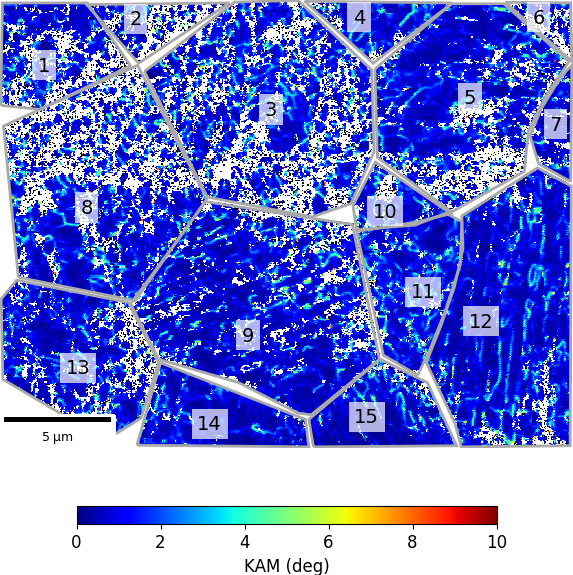

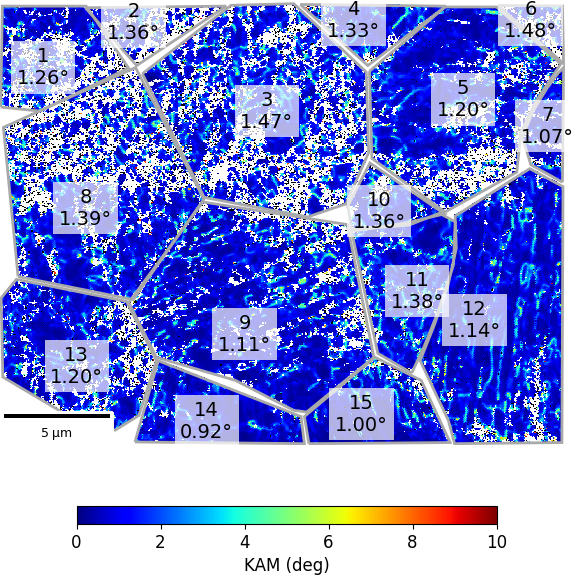

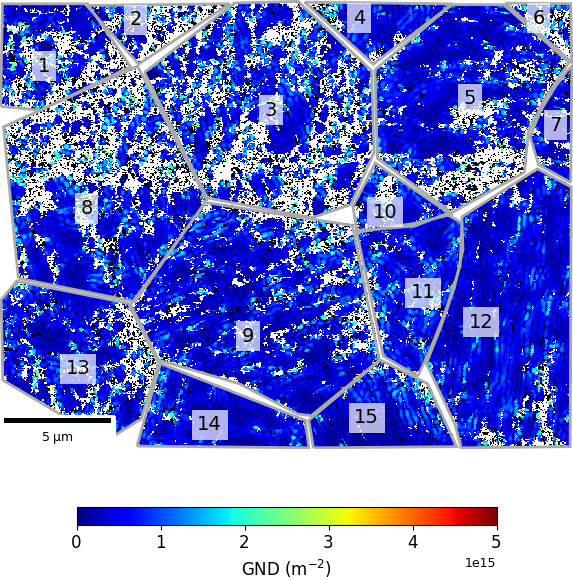

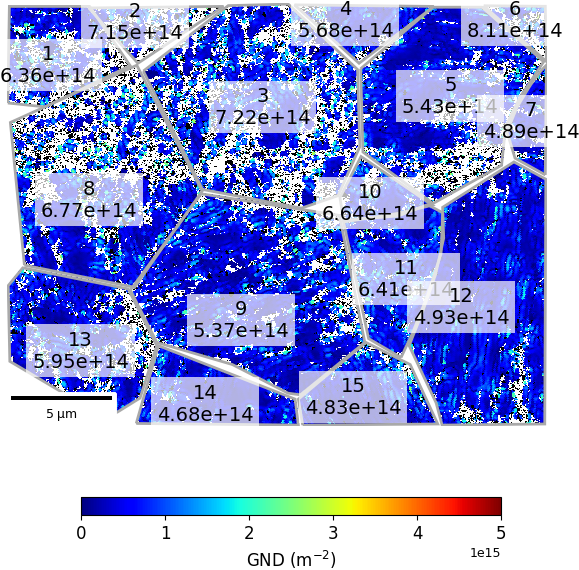

In [31]:
import matplotlib.colors as mcolors
import matplotlib.cm as cm

phase = 'A'
colorbar_fontsize = 12   # adjustable

quantities = [
    {'attr': 'kam', 'color_by': 'KAM', 'label': 'KAM (deg)', 'fmt': '{:.2f}°', 'tag': 'kam'},
    {'attr': 'GND', 'color_by': 'GND', 'label': r'GND (m$^{-2}$)', 'fmt': '{:.2e}', 'tag': 'gnd'},
]

for q in quantities:
    dataEBSD = None
    global_vals = []
    for roiID in range(1, len(dataEBSD_placeholder_range)):
        checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')
        try:
            state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
        except FileNotFoundError:
            continue
        dataEBSD = state['dataEBSD']
        clustering_result = state['clustering_result']
        recipe = state['recipe']

        roi_mask = dataEBSD.rois.masks[recipe['roiID']]
        phase_id = dataEBSD.phase_ids[phase]
        phase_mask = dataEBSD.phases_id == phase_id
        grain_phase_mask = roi_mask & phase_mask
        vals = getattr(dataEBSD, q['attr'])[grain_phase_mask]
        vals = vals[np.isfinite(vals)]
        if vals.size:
            global_vals.append(vals)

    if not global_vals:
        raise ValueError(f"No valid {q['attr']} data found across grains")
    all_vals = np.concatenate(global_vals)

    # ---- colorbar always starts at 0, max rounded UP to a "nice" number ----
    vmin = 0.0
    raw_max = float(np.nanmax(all_vals))
    vmax = ebsdlib._nice_ceil(raw_max)

    for SHOW_AVERAGE in [False, True]:
        fig, ax = plt.subplots(1, figsize=(6, 6))
        dataEBSD = None

        for roiID in range(1, len(dataEBSD_placeholder_range)):
            checkpoint_path = os.path.join(filepath, f'grain_{str(roiID).zfill(4)}.h5')
            try:
                state = load_checkpoint(checkpoint_path, dataEBSD=dataEBSD)
            except FileNotFoundError:
                continue

            dataEBSD = state['dataEBSD']
            clustering_result = state['clustering_result']
            recipe = state['recipe']

            visualizer = EBSDVisualizer()
            visualizer.plotClusters(clustering_result, ax=ax, fig=fig, globalScale=True,
                                     tiling=None, roi=recipe['roiID'], phase=phase,
                                     vmin=vmin, vmax=vmax, color_by=q['color_by'])

            roi_mask = dataEBSD.rois.masks[recipe['roiID']]
            com = np.mean(dataEBSD.selector.selVerts[recipe['roiID']], axis=0)

            if SHOW_AVERAGE:
                phase_id = dataEBSD.phase_ids[phase]
                phase_mask = dataEBSD.phases_id == phase_id
                grain_phase_mask = roi_mask & phase_mask
                vals = getattr(dataEBSD, q['attr'])[grain_phase_mask]
                vals = vals[np.isfinite(vals)]
                mean_val = float(np.nanmean(vals)) if vals.size else float('nan')
                label_text = f'{roiID}\n{q["fmt"].format(mean_val)}'
            else:
                label_text = f'{roiID}'

            ax.text(com[0], com[1], label_text, fontsize=14, color='k',
                    ha='center', va='center',
                    bbox=dict(facecolor='white', edgecolor='none', alpha=0.7), zorder=1e5)

        for roiID in range(1, len(dataEBSD.rois.masks_by_phase)):
            patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None',
                                       edgecolor='darkgrey', lw=2)
            ax.add_patch(patch)

        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
        sm = cm.ScalarMappable(cmap='jet', norm=norm)
        sm.set_array([])
        cax = fig.add_axes([0.15, 0.04, 0.7, 0.03])
        cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
        cbar.set_label(q['label'], fontsize=colorbar_fontsize)
        cbar.ax.tick_params(labelsize=colorbar_fontsize)

        tag = 'avg' if SHOW_AVERAGE else 'id_only'
        figname = os.path.join(filepath, f'{q["tag"]}_allgrains_{tag}')

        fig.tight_layout(rect=[0, 0.08, 1, 1])
        if SAVE:
            for figform in iforms:
                fig.savefig(figname + '.' + figform, bbox_inches='tight',
                            dpi=figparam['dpi'], facecolor=figparam['facecolor'], edgecolor=figparam['edgecolor'],
                            orientation=figparam['orientation'], format=figform,
                            transparent=figparam['transparent'], pad_inches=figparam['pad_inches'])